# NMF Source Separation

Piano notes consist of a very stable stack of harmonics for each note, with a smooth decay.  This kind of sound event can be well captured by separable time and frequency components, i.e., a single spectral profile modulated in time by the decaying envelope of each note event.  NMF (Nonnegative Matrix Factorization) tries to find the best decomposition of a matrix into a fixed number of spectrum/envelope pairs.  Under the right circumstances, these components can end up being individual piano notes - although controlling it can be tricky.  This practical uses the NMF implementation from `sklearn` (which is wrapped by `librosa`) to decompose a brief excerpt of piano.

In [1]:
%pylab inline
from __future__ import print_function
import os
import time
import IPython

import numpy as np

import librosa

Populating the interactive namespace from numpy and matplotlib


In [2]:
y, sr = librosa.load('gould-wtc1.wav', sr=None)
print(sr, y.shape)

11025 (330750,)


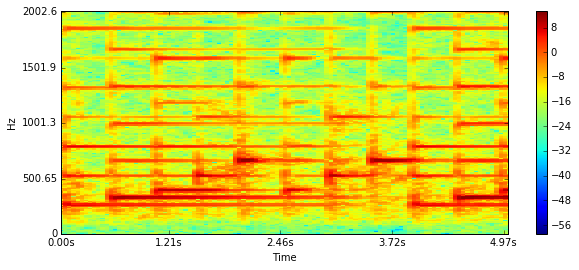

In [3]:
# STFT analysis of the piano excerpt.
n_fft = 1024
S = librosa.stft(y, n_fft=n_fft)
plt.figure(figsize=(10, 4))
# Zoom in on the first few notes, and the lowest few harmonics.
t_max = 5.0
f_max = 2000.0
# tmax, fmax may not work here on your version of librosa.
librosa.display.specshow(librosa.logamplitude(S), sr=sr, x_axis='time', y_axis='linear', 
                         tmax=t_max, fmax=f_max, cmap='jet')
plt.colorbar()
IPython.display.Audio(y, rate=sr)

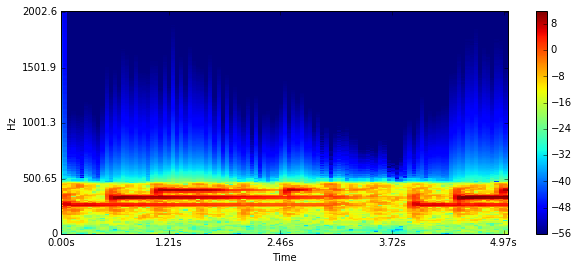

In [4]:
# Filter out the first three notes by a low-pass filter, applied directly
# on the spectrogram.  It looks like cutting at 450 Hz should do it, so 
# zero out all the bins above that.
cutoff_bin = int(round(450.0 / sr * n_fft))
S_lpf = S.copy()
S_lpf[cutoff_bin:] = 0
# Convert spectrogram back to audio.
y_lpf = librosa.istft(S_lpf)
plt.figure(figsize=(10, 4))
# Re-analyze back into STFT
librosa.display.specshow(librosa.logamplitude(librosa.stft(y_lpf, n_fft=n_fft)), 
                         sr=sr, x_axis='time', y_axis='linear', 
                         tmax=t_max, fmax=f_max, cmap='jet')
plt.colorbar()
plt.clim([-56, 12])
IPython.display.Audio(y_lpf, rate=sr)

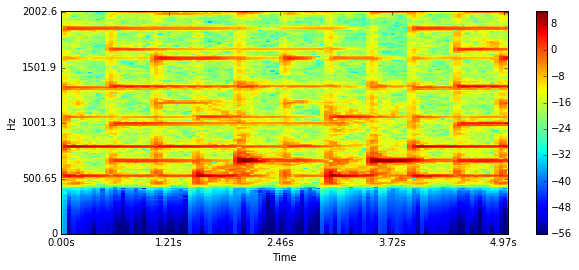

In [5]:
# The LPF removes the higher notes, but using an HPF doesn't do 
# so well to remove the lower notes, because their higher harmonics 
# still come through.
S_hpf = S.copy()
S_hpf[:cutoff_bin] = 0
y_hpf = librosa.istft(S_hpf)
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.logamplitude(librosa.stft(y_hpf, n_fft=n_fft)), 
                         sr=sr, x_axis='time', y_axis='linear', 
                         tmax=t_max, fmax=f_max, cmap='jet')
plt.colorbar()
plt.clim([-56, 12])
IPython.display.Audio(y_hpf, rate=sr)

# NMF Decomposition

`librosa.decompose.decompose` uses `sklearn.decomposition.NMF` to approximate the spectrogram 
as rank-1 spectrum x activation components.
We want one component per note; there are a few dozen distinct 
notes in the excerpt, so we attempt to set `n_components` to provide one component for each.


In [6]:
# Perform NMF decomposition.
n_components = 40
# alpha is the weight for the L1 (sparsity) penalty.  With alpha as zero, the components simply 
# try to minimize the error in reproducing the spectrogram.
W, H = librosa.decompose.decompose(np.abs(S), n_components=n_components, sort=True, alpha=0.0)
# W gives one spectral profile per component, and H gives the corresponding time activations.
print(W.shape, H.shape)

(513, 40) (40, 1292)


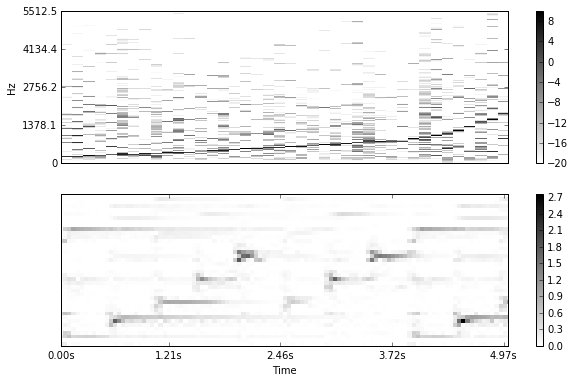

In [7]:
# Look at the individual spectral slices in W and the activations in H.
# decompose() sorts the W slices by the frequency of their max-magnitude bin, usually the fundamental.
plt.figure(figsize=(10, 6))
plt.subplot(211)
librosa.display.specshow(librosa.logamplitude(W), sr=sr, x_axis='off', y_axis='linear', cmap='gray_r')
plt.clim([-20, 10])
plt.colorbar()
plt.subplot(212)
librosa.display.specshow(np.abs(H), sr=sr, x_axis='time', 
                         tmax=t_max, fmax=f_max, cmap='gray_r')
plt.colorbar()

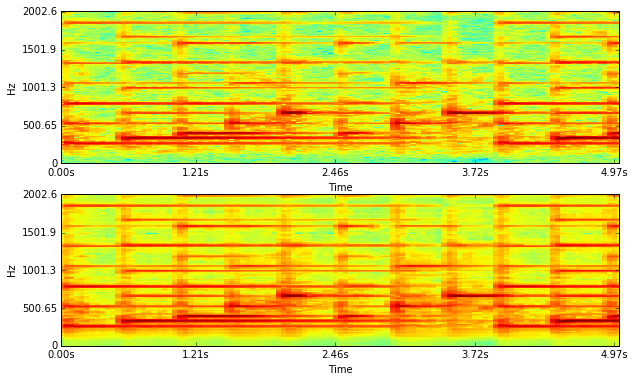

In [8]:
# The dot-product of W and H gives the complete approximated reconstruction of the input 
# spectrogram.  With enough components, it looks close; look at them side-by-side
plt.figure(figsize=(10, 6))
plt.subplot(211)
librosa.display.specshow(librosa.logamplitude(S), sr=sr, x_axis='time', y_axis='linear', 
                         tmax=t_max, fmax=f_max, cmap='jet')
plt.subplot(212)
librosa.display.specshow(librosa.logamplitude(np.dot(W, H)), sr=sr, x_axis='time', y_axis='linear', 
                         tmax=t_max, fmax=f_max, cmap='jet')

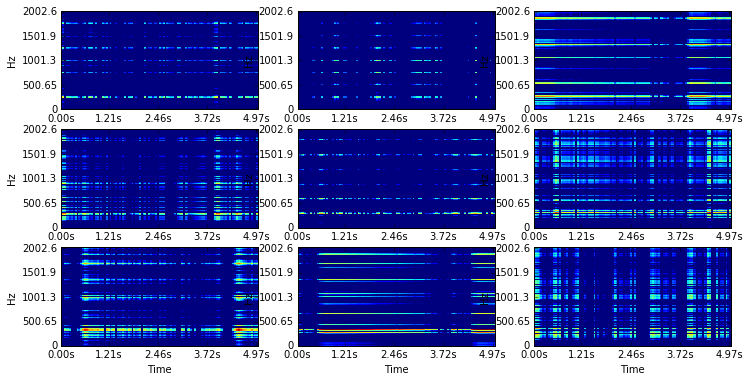

In [9]:
# Calculate masking as proportion of full reconstruction.
masks = np.zeros((n_components, S.shape[0], S.shape[1]))
for n in range(n_components):
    masks[n] = np.dot(W[:,[n]], H[[n]])
total = np.sum(masks, axis=0)
total += (total == 0)
num_to_show = 9
plt.figure(figsize=(12, 6))
for n in range(num_to_show):
    plt.subplot(3, 3, n + 1)
    librosa.display.specshow(librosa.logamplitude(masks[n]), sr=sr, x_axis='time', y_axis='linear', 
                             tmax=t_max, fmax=f_max, cmap='jet')
    clim([-30, 10])
    Y = masks[n] / total * S
    y = librosa.istft(Y)
    IPython.display.display( IPython.display.Audio(y, rate=sr) )

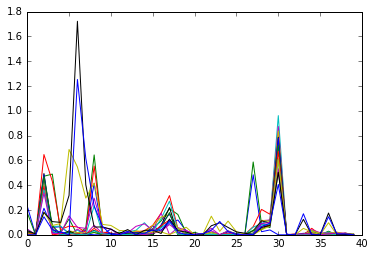

In [10]:
# Which components actually encode the first note?
_ = plt.plot(H[:, :15])

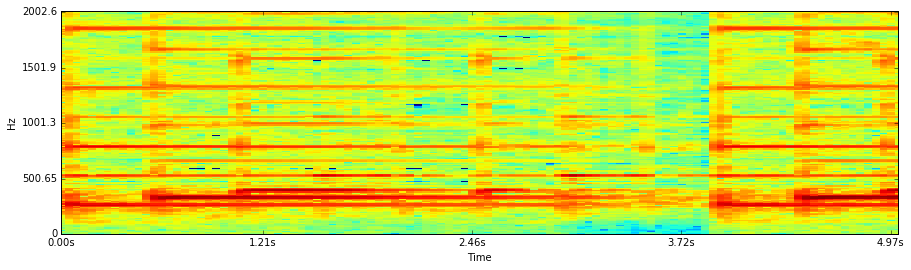

In [12]:
# Reconstruct based only the lowest-fundamental components (plus a few higher ones that seem invovled).
num_low_components = 12
extras = num_low_components + np.nonzero(np.max(H[num_low_components:, :15], axis=1) > 0.2)[0]
components_to_use = range(num_low_components)
components_to_use.extend(extras.tolist())
mask = np.dot(W[:, components_to_use], H[components_to_use])
Y_R = mask / total * S
plt.figure(figsize=(15, 4))
librosa.display.specshow(librosa.logamplitude(Y_R), sr=sr, x_axis='time', y_axis='linear', 
                             tmax=t_max, fmax=f_max, cmap='jet')
y_r = librosa.istft(Y_R)
IPython.display.display(IPython.display.Audio(y_r, rate=sr) )

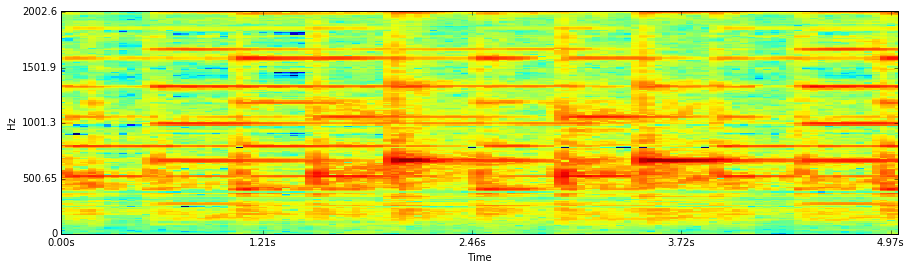

In [13]:
# Reconstruct using all the remaining components - the other notes.
remaining_components = range(n_components)
for component in components_to_use:
    remaining_components.remove(component)
mask = np.dot(W[:, remaining_components], H[remaining_components])
Y_R = mask / total * S
plt.figure(figsize=(15, 4))
librosa.display.specshow(librosa.logamplitude(Y_R), sr=sr, x_axis='time', y_axis='linear', 
                             tmax=t_max, fmax=f_max, cmap='jet')
y_r = librosa.istft(Y_R)
IPython.display.display( IPython.display.Audio(y_r, rate=sr) )